<a href="https://colab.research.google.com/github/Tarekkk1/image-search-engine/blob/main/convolutional_neural_network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Convolutional Neural Network

### Importing the libraries

In [12]:
import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense



## Part 1 - Data Preprocessing

### Preprocessing the Training set

In [13]:
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)
training_set = train_datagen.flow_from_directory('/content/drive/MyDrive/Dataset/MY_data/train',
                                                 target_size = (64, 64),
                                                 batch_size = 32,
                                                 class_mode = 'categorical')

Found 2301 images belonging to 10 classes.


### Preprocessing the Test set

In [14]:
test_datagen = ImageDataGenerator(rescale = 1./255)
test_set = test_datagen.flow_from_directory('/content/drive/MyDrive/Dataset/MY_data/test',
                                            target_size = (64, 64),
                                            batch_size = 32,
                                            class_mode = 'categorical')

Found 1025 images belonging to 10 classes.


In [15]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Part 2 - Building the CNN

### Initialising the CNN

In [16]:
cnn = Sequential()

### Step 1 - Convolution

In [17]:
cnn.add(Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)))

### Step 2 - Pooling

In [18]:
cnn.add(MaxPooling2D(pool_size=(2, 2)))

### Step 3 - Flattening

In [19]:
cnn.add(Flatten())

### Step 4 - Full Connection

In [20]:
cnn.add(Dense(128, activation='relu'))


### Step 5 - Output Layer

In [21]:
cnn.add(Dense(10, activation='softmax'))

## Part 3 - Training the CNN

### Compiling the CNN

In [22]:
cnn.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [27]:

cnn.fit(x = training_set, validation_data = test_set, epochs = 30, batch_size = 64)


Epoch 1/30
72/72 [==============================] - 24s 329ms/step - loss: 0.6125 - accuracy: 0.7888 - val_loss: 1.9481 - val_accuracy: 0.4859
Epoch 2/30
72/72 [==============================] - 23s 326ms/step - loss: 0.5904 - accuracy: 0.7962 - val_loss: 2.1434 - val_accuracy: 0.4888
Epoch 3/30
72/72 [==============================] - 24s 332ms/step - loss: 0.5645 - accuracy: 0.8075 - val_loss: 2.1315 - val_accuracy: 0.5024
Epoch 4/30
72/72 [==============================] - 24s 337ms/step - loss: 0.4977 - accuracy: 0.8288 - val_loss: 2.3530 - val_accuracy: 0.4712
Epoch 5/30
72/72 [==============================] - 24s 326ms/step - loss: 0.5391 - accuracy: 0.8175 - val_loss: 2.0295 - val_accuracy: 0.5122
Epoch 6/30
72/72 [==============================] - 24s 336ms/step - loss: 0.5079 - accuracy: 0.8314 - val_loss: 2.2059 - val_accuracy: 0.5044
Epoch 7/30
72/72 [==============================] - 25s 340ms/step - loss: 0.4422 - accuracy: 0.8570 - val_loss: 2.2858 - val_accuracy: 0.5288

In [28]:
import numpy as np
from PIL import Image
from tensorflow.keras.preprocessing import image

test_image = Image.open('/content/drive/MyDrive/Dataset/MY_data/train/orange/img_1011.jpeg')
test_image = test_image.resize((64, 64))
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
result = cnn.predict(test_image)
training_set.class_indices

class_indices = training_set.class_indices
prediction = ''
for key, value in class_indices.items():
    if result[0][value] == 1:
        prediction = key
        break

print(prediction)


1/1 [==============================] - 0s 101ms/step
orange


1/1 [==============================] - 0s 24ms/step


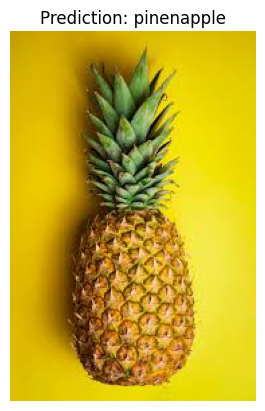

1/1 [==============================] - 0s 27ms/step


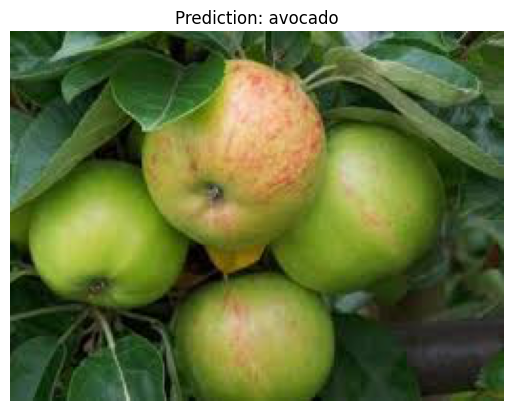

1/1 [==============================] - 0s 30ms/step


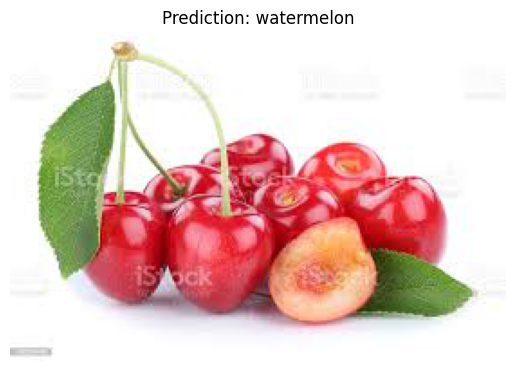

1/1 [==============================] - 0s 24ms/step


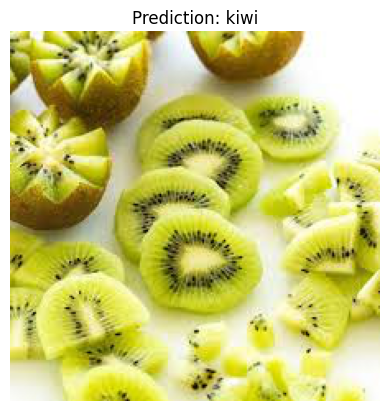

1/1 [==============================] - 0s 24ms/step


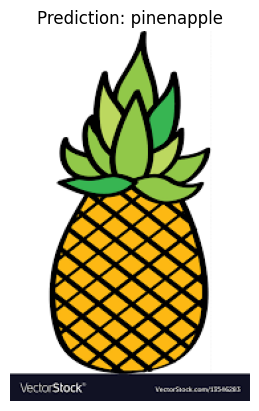

1/1 [==============================] - 0s 25ms/step


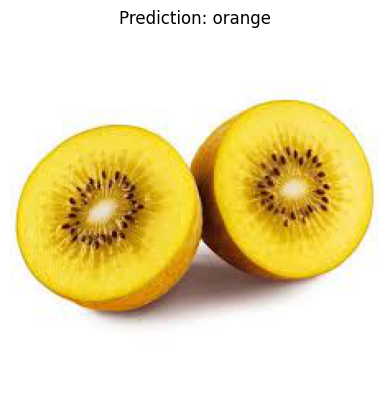

1/1 [==============================] - 0s 41ms/step


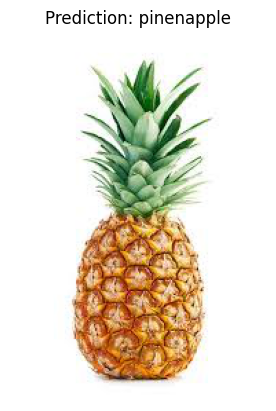

1/1 [==============================] - 0s 23ms/step


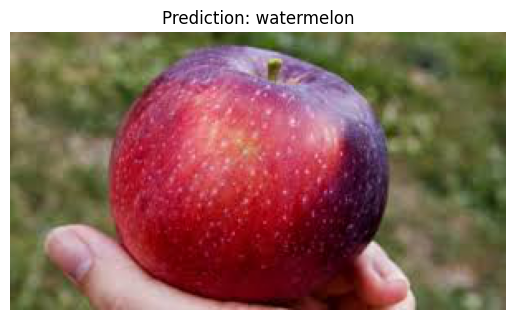

1/1 [==============================] - 0s 29ms/step


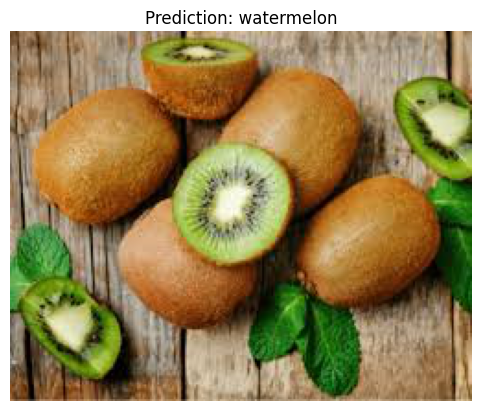

1/1 [==============================] - 0s 34ms/step


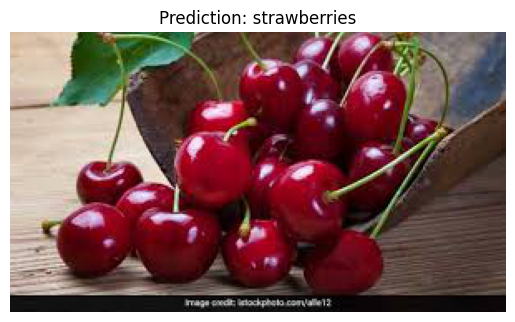

1/1 [==============================] - 0s 32ms/step


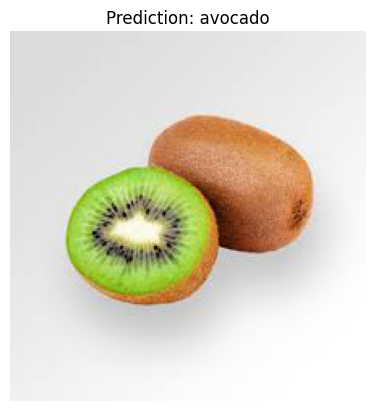

1/1 [==============================] - 0s 27ms/step


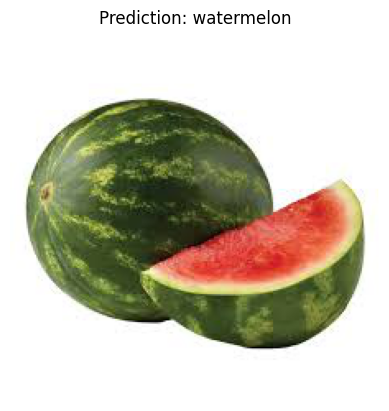

1/1 [==============================] - 0s 39ms/step


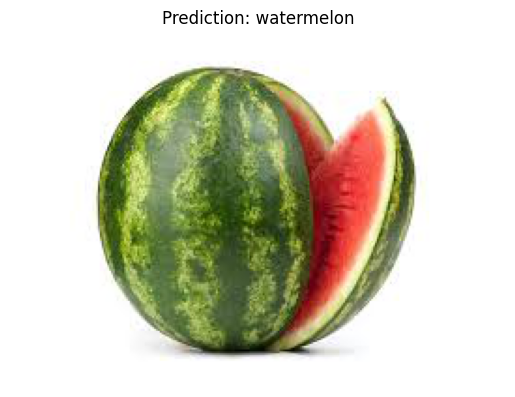

1/1 [==============================] - 0s 45ms/step


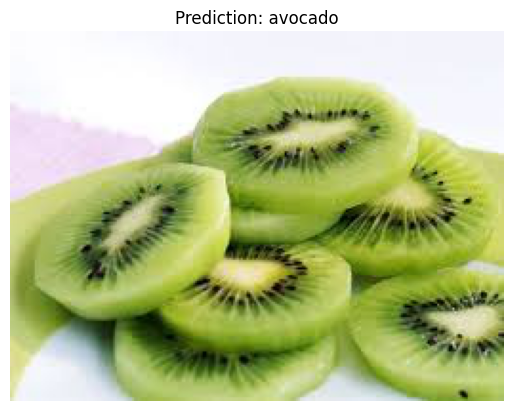

1/1 [==============================] - 0s 40ms/step


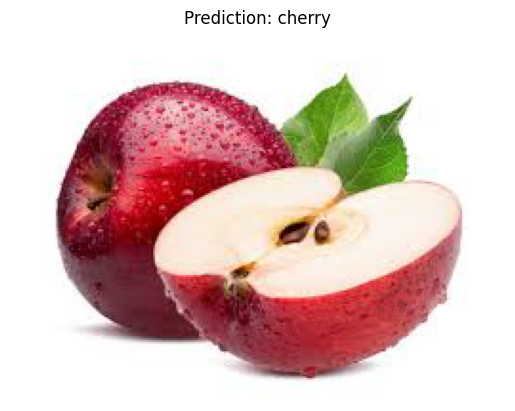

1/1 [==============================] - 0s 39ms/step


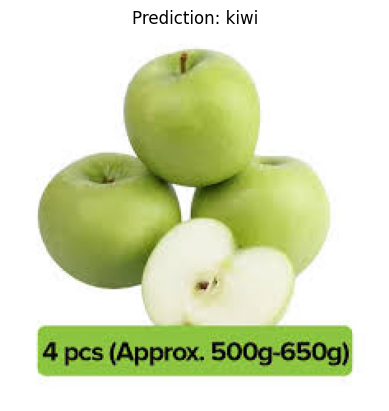

1/1 [==============================] - 0s 28ms/step


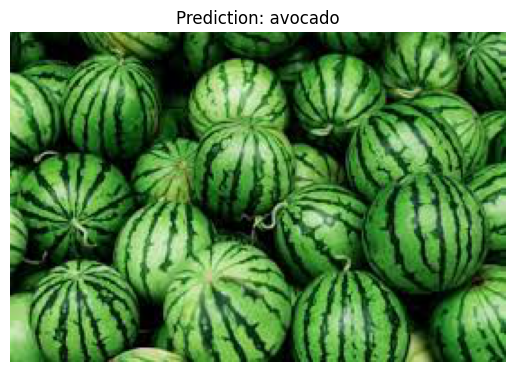

1/1 [==============================] - 0s 39ms/step


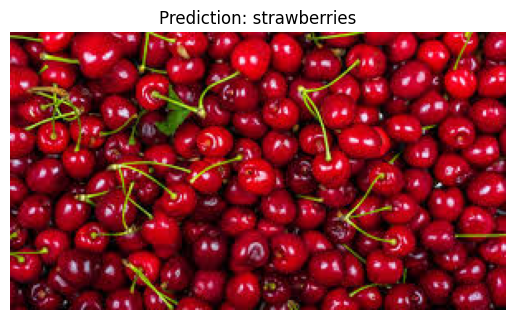

1/1 [==============================] - 0s 40ms/step


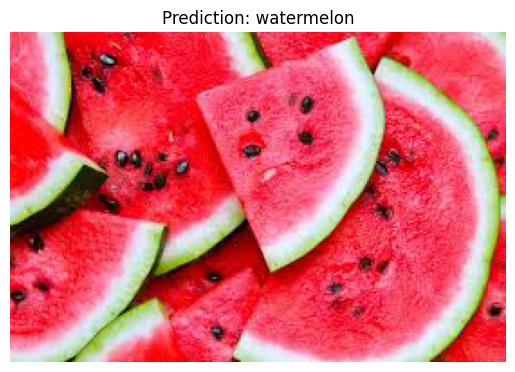

1/1 [==============================] - 0s 36ms/step


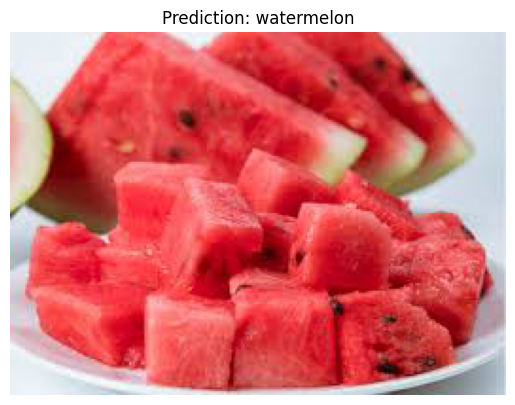

1/1 [==============================] - 0s 48ms/step


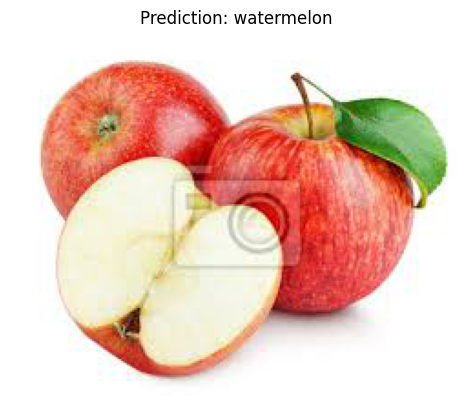

1/1 [==============================] - 0s 47ms/step


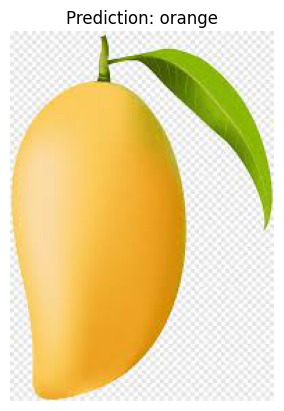

1/1 [==============================] - 0s 43ms/step


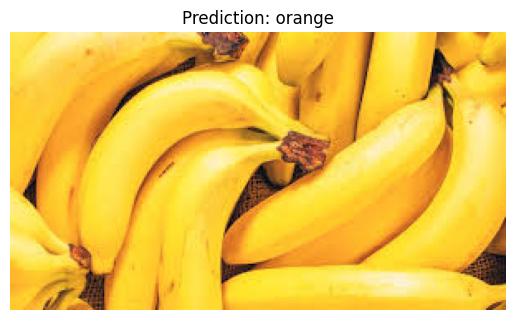

1/1 [==============================] - 0s 43ms/step


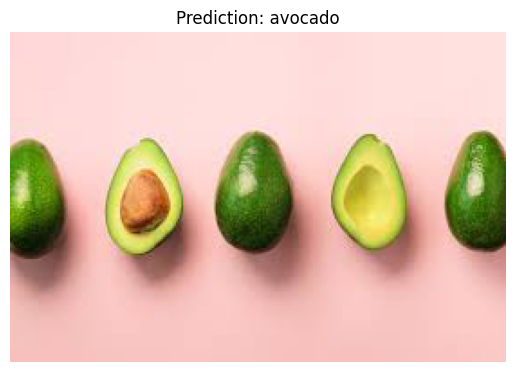

1/1 [==============================] - 0s 35ms/step


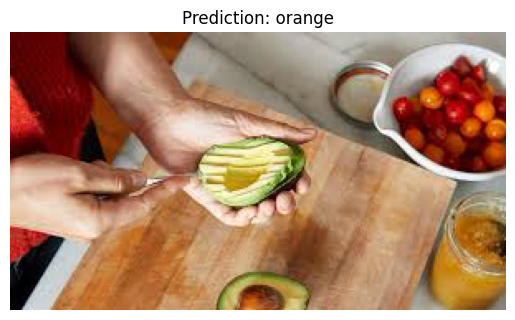

1/1 [==============================] - 0s 40ms/step


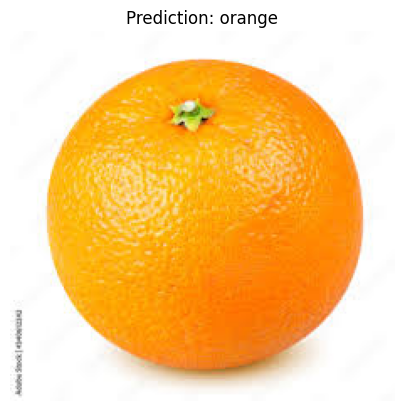

1/1 [==============================] - 0s 34ms/step


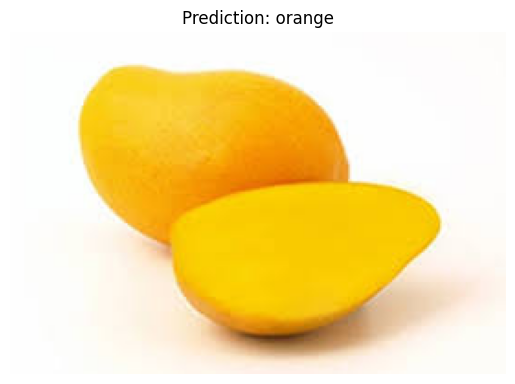

1/1 [==============================] - 0s 36ms/step


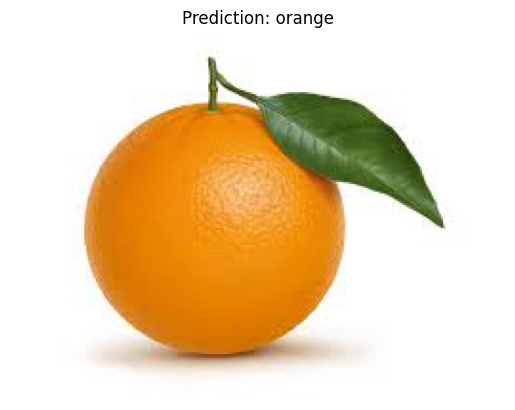

1/1 [==============================] - 0s 44ms/step


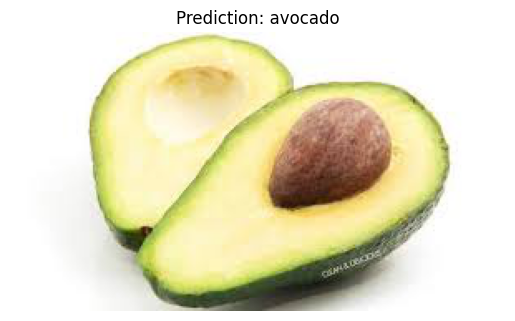

1/1 [==============================] - 0s 36ms/step


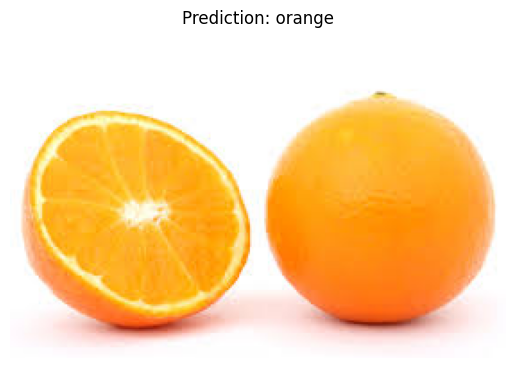

1/1 [==============================] - 0s 34ms/step


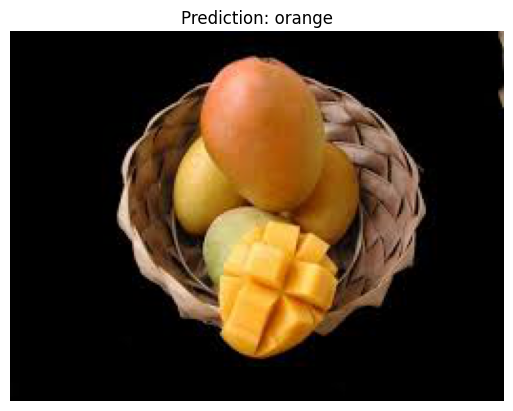

1/1 [==============================] - 0s 54ms/step


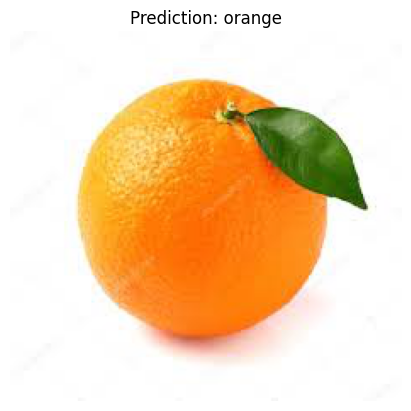

1/1 [==============================] - 0s 35ms/step


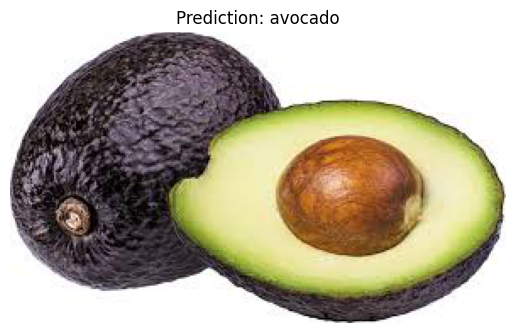

1/1 [==============================] - 0s 37ms/step


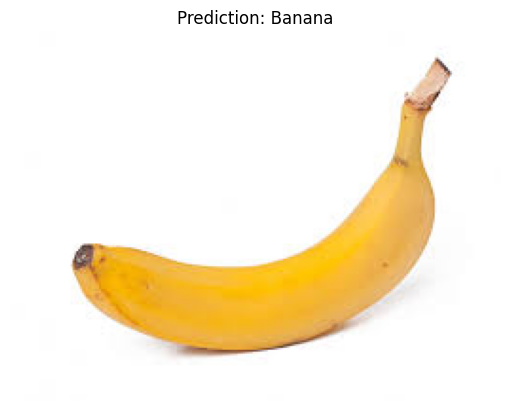

1/1 [==============================] - 0s 79ms/step


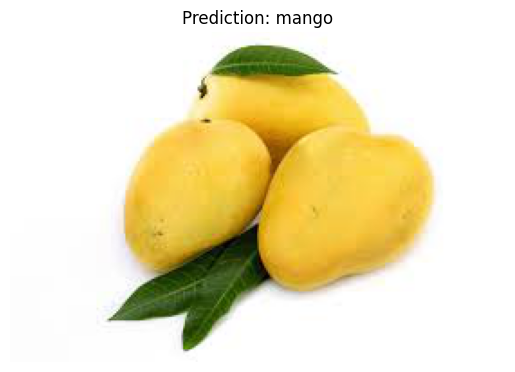

1/1 [==============================] - 0s 34ms/step


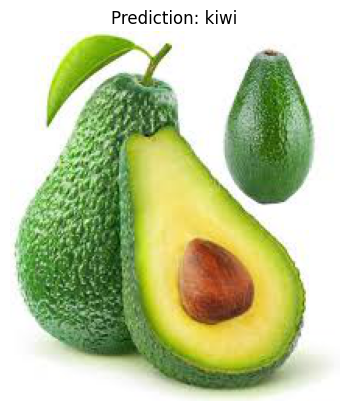

1/1 [==============================] - 0s 36ms/step


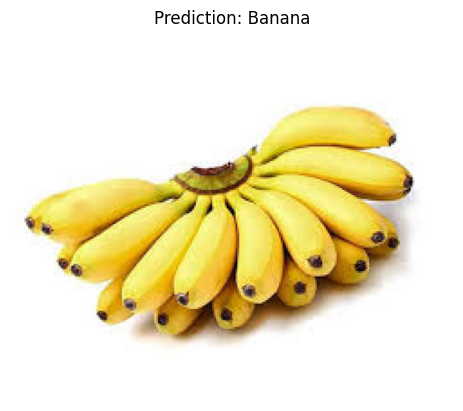

1/1 [==============================] - 0s 39ms/step


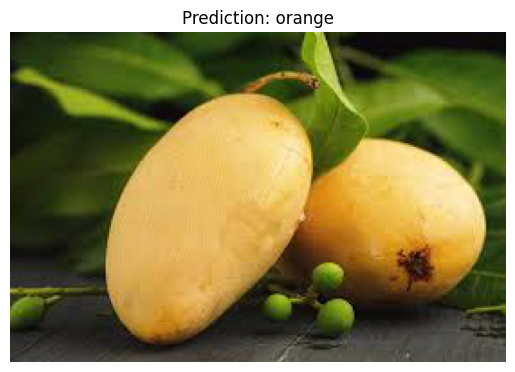

1/1 [==============================] - 0s 61ms/step


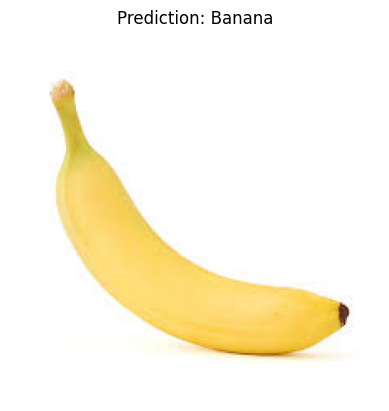

1/1 [==============================] - 0s 39ms/step


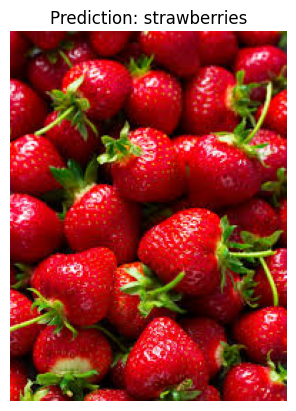

1/1 [==============================] - 0s 51ms/step


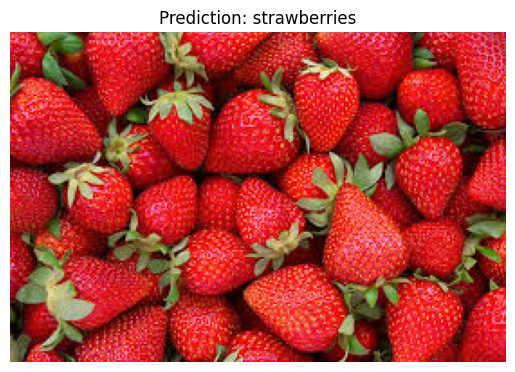

1/1 [==============================] - 0s 47ms/step


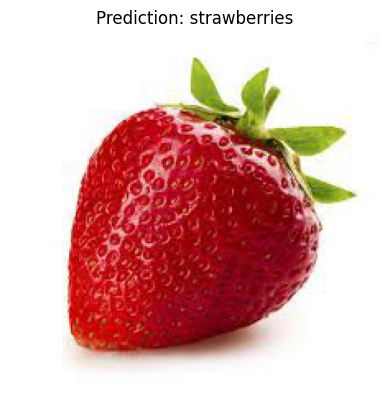

1/1 [==============================] - 0s 41ms/step


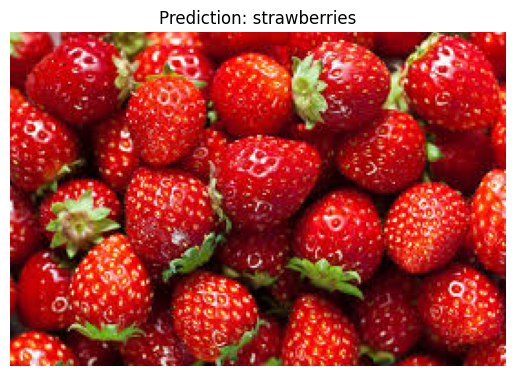

1/1 [==============================] - 0s 42ms/step


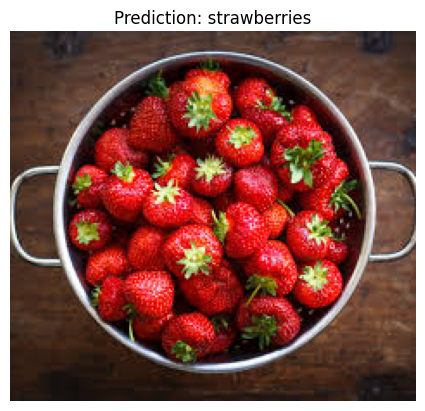

1/1 [==============================] - 0s 42ms/step


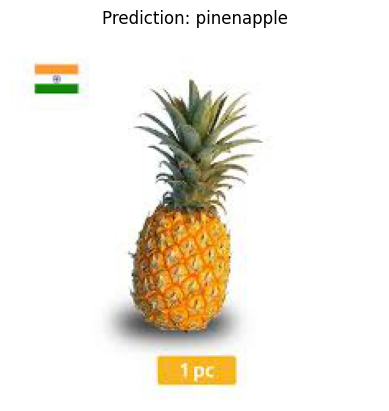

1/1 [==============================] - 0s 40ms/step


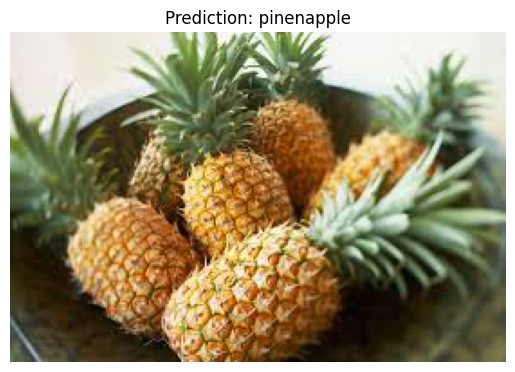

1/1 [==============================] - 0s 52ms/step


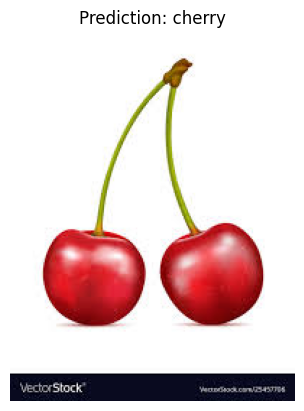

1/1 [==============================] - 0s 33ms/step


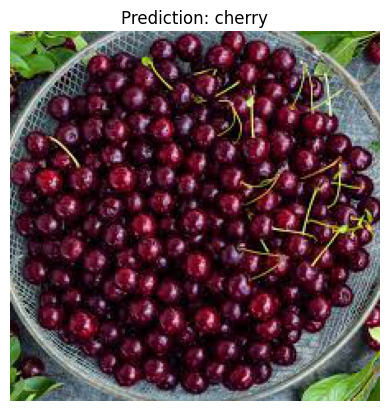

In [29]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

predict_folder = "/content/drive/MyDrive/Dataset/MY_data/predict"
for filename in os.listdir(predict_folder):
    if filename.endswith(".jpg") or filename.endswith(".jpeg"):
        image_path = os.path.join(predict_folder, filename)
        test_image = image.load_img(image_path, target_size=(64, 64))
        test_image = image.img_to_array(test_image)
        test_image = np.expand_dims(test_image, axis=0)
        result = cnn.predict(test_image)

        # Assuming you have 10 categories, modify the prediction code accordingly
        class_indices = training_set.class_indices
        prediction = ""
        for key, value in class_indices.items():
            if result[0][value] == 1:
                prediction = key
                break

        # Display the image with the prediction
        img = image.load_img(image_path)
        plt.imshow(img)
        plt.title(f"Prediction: {prediction}")
        plt.axis("off")
        plt.show()